In [ ]:
%cd ../

# %config InlineBackend.figure_format="svg"

/home/marco/contrast-gan-3D


In [ ]:
from contrast_gan_3D import config

config.CADRADS_DATASET.resolve()

PosixPath('/home/roel/data/IDR_CADRADS/image')

In [ ]:
cadrads_img_path = config.CADRADS_DATASET / "image3095" / "3095.mhd"
cadrads_img_path.is_file()

True

In [ ]:
cadrads_img_h5_path = cadrads_img_path.with_suffix(".h5")
cadrads_img_h5_path.is_file()

True

In [ ]:
from contrast_gan_3D.utils import io_utils

cadrads_img_h5, cadrads_meta_h5, _ = io_utils.load_h5_image(
    cadrads_img_h5_path, is_cadrads=True
)
print(cadrads_img_h5.shape)

(512, 512, 303)


In [ ]:
# cadrads_img, cadrads_meta = io_utils.load_sitk_image(cadrads_img_path)
# print(cadrads_img.shape)
# cadrads_meta

In [ ]:
from matplotlib import pyplot as plt

from monai.visualize import matshow3d

# fig, ax = plt.subplots(figsize=(15, 10))
# matshow3d(cadrads_img, fig=ax, every_n=20, cmap="gray");

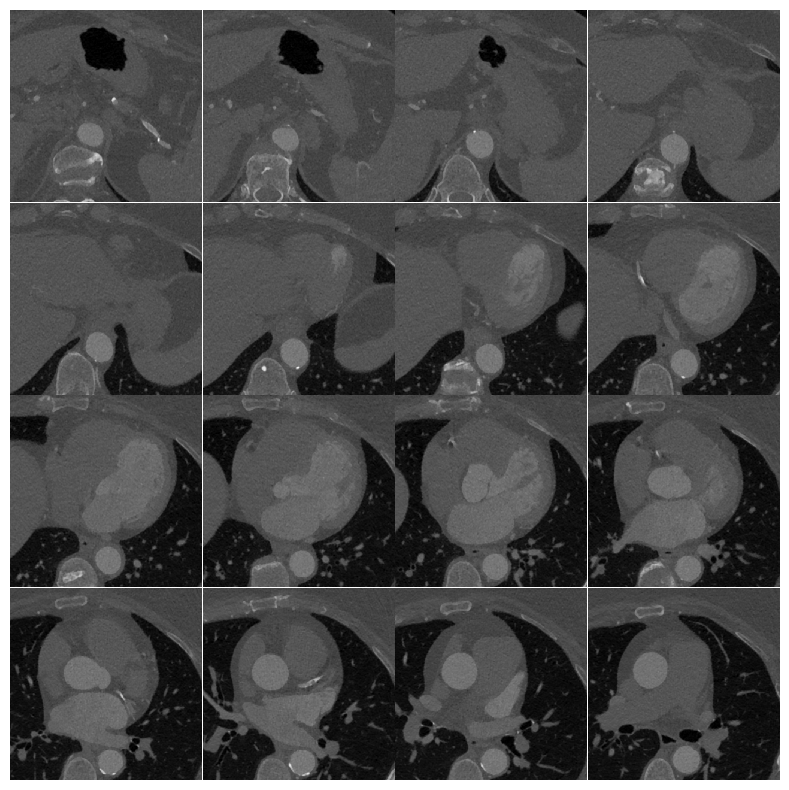

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
matshow3d(cadrads_img_h5[::].swapaxes(2, 0), fig=ax, every_n=20, cmap="gray");

In [ ]:
from contrast_gan_3D.utils import geometry

cadrads_ctls_world = cadrads_meta_h5["centerlines"]
print(cadrads_ctls_world.shape)
cadrads_ctls_image = geometry.world_to_image_coords(
    cadrads_ctls_world[:, :3], cadrads_meta_h5["offset"], cadrads_meta_h5["spacing"]
)
cadrads_ctls_image[:10]

(78, 4)


array([[299, 283, 233],
       [295, 283, 237],
       [295, 283, 237],
       [291, 279, 239],
       [288, 279, 241],
       [286, 277, 242],
       [283, 277, 243],
       [281, 277, 245],
       [279, 277, 246],
       [276, 275, 247]])

In [ ]:
import numpy as np

rng = np.random.default_rng()
rng

Generator(PCG64) at 0x7F5ED00BF300

In [ ]:
n_ctls_samples = len(cadrads_ctls_image)
# n_ctls_samples = 27
chosen_ctls = np.sort(rng.choice(cadrads_ctls_image, n_ctls_samples), axis=0)
chosen_ctls[:10]

array([[175, 138, 210],
       [176, 141, 212],
       [177, 144, 213],
       [188, 148, 214],
       [189, 150, 214],
       [192, 153, 214],
       [193, 163, 216],
       [193, 165, 217],
       [194, 168, 218],
       [195, 170, 222]])

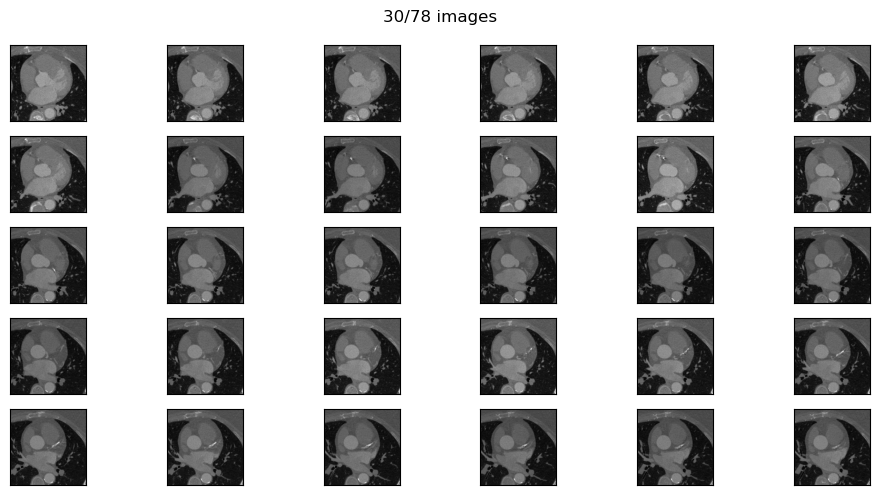

In [ ]:
from contrast_gan_3D.utils.visualization import (
    plot_axial_slices,
    plot_axial_centerlines,
)

x = cadrads_img_h5[..., np.unique(chosen_ctls[..., 2])]
plot_axial_slices(x, title=f"{x.shape[-1]}/{len(chosen_ctls)} images", figsize=(10, 5));

array([[<Axes: title={'center': '(175, 138, 210), 1'}>,
        <Axes: title={'center': '(176, 141, 212), 1'}>,
        <Axes: title={'center': '(177, 144, 213), 1'}>,
        <Axes: title={'center': '214, 3'}>,
        <Axes: title={'center': '(193, 163, 216), 1'}>,
        <Axes: title={'center': '(193, 165, 217), 1'}>],
       [<Axes: title={'center': '(194, 168, 218), 1'}>,
        <Axes: title={'center': '(195, 170, 222), 1'}>,
        <Axes: title={'center': '(195, 170, 223), 1'}>,
        <Axes: title={'center': '227, 2'}>,
        <Axes: title={'center': '(200, 181, 228), 1'}>,
        <Axes: title={'center': '(249, 229, 237), 1'}>],
       [<Axes: title={'center': '239, 2'}>,
        <Axes: title={'center': '(250, 231, 241), 1'}>,
        <Axes: title={'center': '242, 3'}>,
        <Axes: title={'center': '243, 3'}>,
        <Axes: title={'center': '244, 4'}>,
        <Axes: title={'center': '(252, 245, 246), 1'}>],
       [<Axes: title={'center': '247, 2'}>,
        <Axes: ti

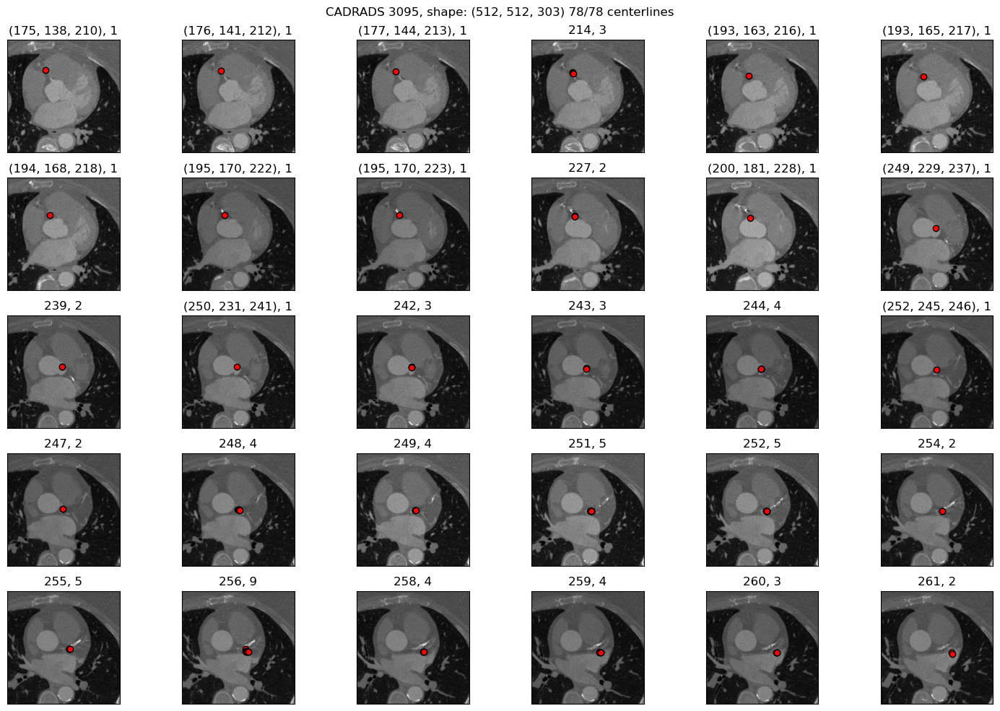

In [ ]:
plot_axial_centerlines(
    cadrads_img_h5,
    chosen_ctls,
    rng=rng,
    title=f"CADRADS {io_utils.stem(cadrads_img_h5_path)}, shape: {cadrads_img_h5.shape}",
    figsize=(15, 10),
)

In [ ]:
asoca_010_img, asoca_010_meta = io_utils.load_sitk_image(
    config.ASOCA_DATASET / "ASOCA-010.mhd"
)
print(asoca_010_img.shape)
asoca_010_meta

(512, 512, 212)


{'spacing': array([0.30664101, 0.30664101, 0.625     ]),
 'offset': array([  60.40000153,   96.09999847, -219.875     ])}

In [ ]:
from contrast_gan_3D.utils import io_utils

centerlines_ASOCA_10 = io_utils.load_centerlines(
    "/home/marco/data/ASOCA_Philips/images/auto_centerlines/ASOCA-010"
)
centerlines_ASOCA_10.shape

(11908, 4)

In [ ]:
asoca_010_ctls_img = geometry.world_to_image_coords(
    centerlines_ASOCA_10[..., :3], asoca_010_meta["offset"], asoca_010_meta["spacing"]
)
print(asoca_010_ctls_img.shape)
asoca_010_ctls_img[:10]

(11908, 3)


array([[243, 235, 163],
       [242, 235, 163],
       [241, 235, 163],
       [240, 234, 163],
       [240, 234, 163],
       [239, 234, 164],
       [238, 233, 164],
       [238, 233, 164],
       [237, 232, 164],
       [237, 232, 164]])

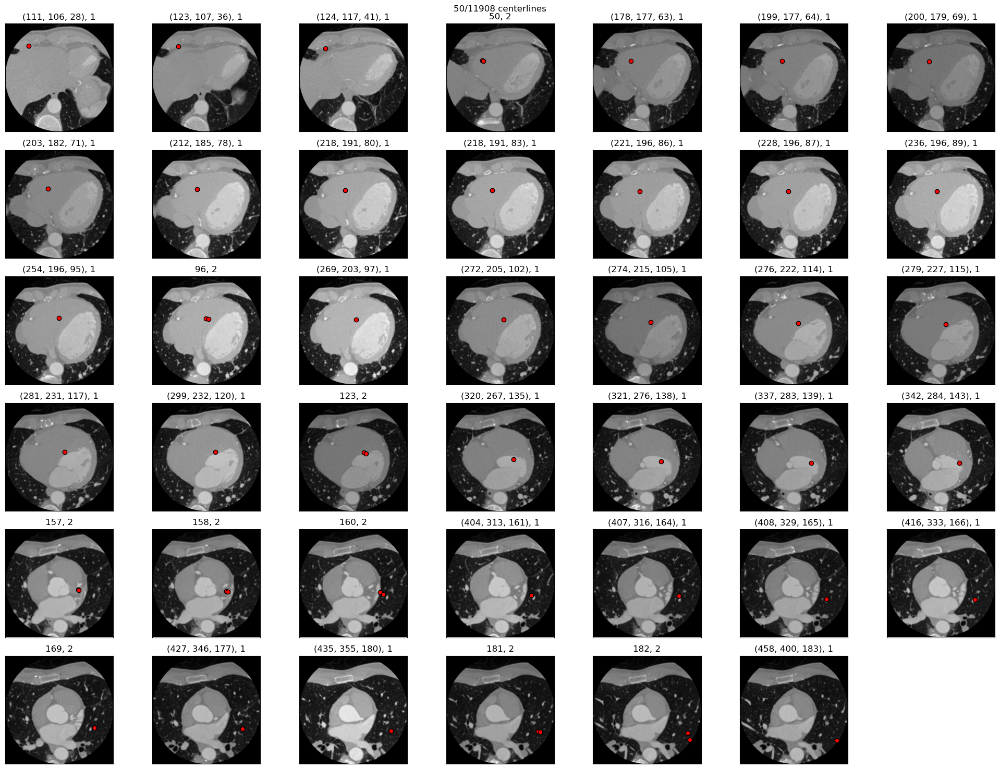

In [ ]:
from contrast_gan_3D.utils import visualization

visualization.plot_axial_centerlines(asoca_010_img, asoca_010_ctls_img, rng=rng, n=50);

In [ ]:
asoca_010_ctls_img_annot = io_utils.load_ASOCA_annotated_centerlines(
    config.ASOCA_DATASET.parent / "centerlines" / "ASOCA-010.ctl.anno"
)
asoca_010_ctls_img_annot = geometry.world_to_image_coords(
    asoca_010_ctls_img_annot, asoca_010_meta["offset"], asoca_010_meta["spacing"]
)
asoca_010_ctls_img_annot.shape

(2505, 3)

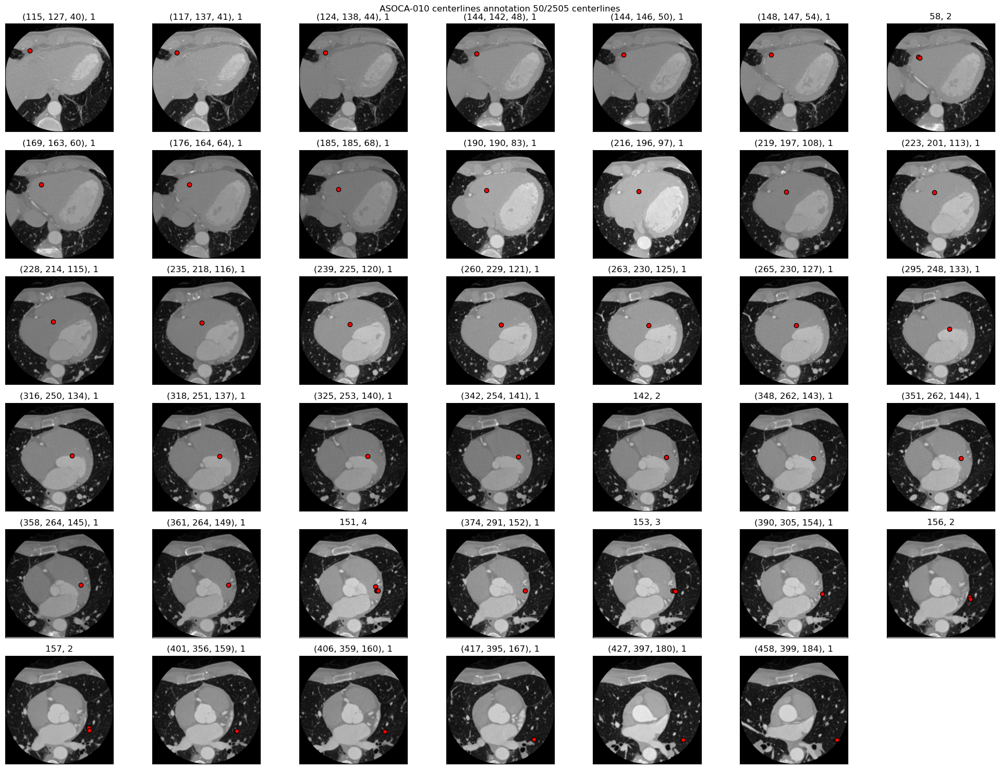

In [ ]:
visualization.plot_axial_centerlines(
    asoca_010_img,
    asoca_010_ctls_img_annot,
    n=50,
    rng=rng,
    title="ASOCA-010 centerlines annotation",
);

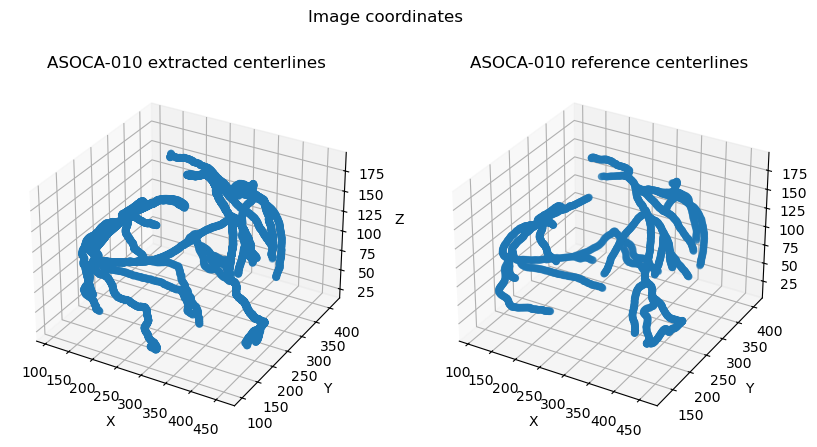

In [ ]:
# %matplotlib widget

fig = plt.figure(figsize=(10, 5))
fig.add_subplot(121, projection="3d")
fig.add_subplot(122, projection="3d")

visualization.plot_centerlines_3D(
    asoca_010_ctls_img,
    "ASOCA-010 extracted centerlines",
    ax=fig.axes[0],
)
visualization.plot_centerlines_3D(
    asoca_010_ctls_img_annot, "ASOCA-010 reference centerlines", ax=fig.axes[1]
)
fig.suptitle("Image coordinates")

plt.show()
plt.close(fig)

In [ ]:
from pathlib import Path

mmwhs_path = Path("/home/marco/data/MMWHS/ct_train/ct_train_1001_image.nii.gz")

mmhws_img, mmhws_meta = io_utils.load_sitk_image(mmwhs_path)
print(mmhws_img.shape)
print(mmhws_meta)

(512, 512, 363)
{'spacing': array([0.35546875, 0.35546875, 0.44999999]), 'offset': array([ -45.5       ,  228.58453369, -271.88000488])}


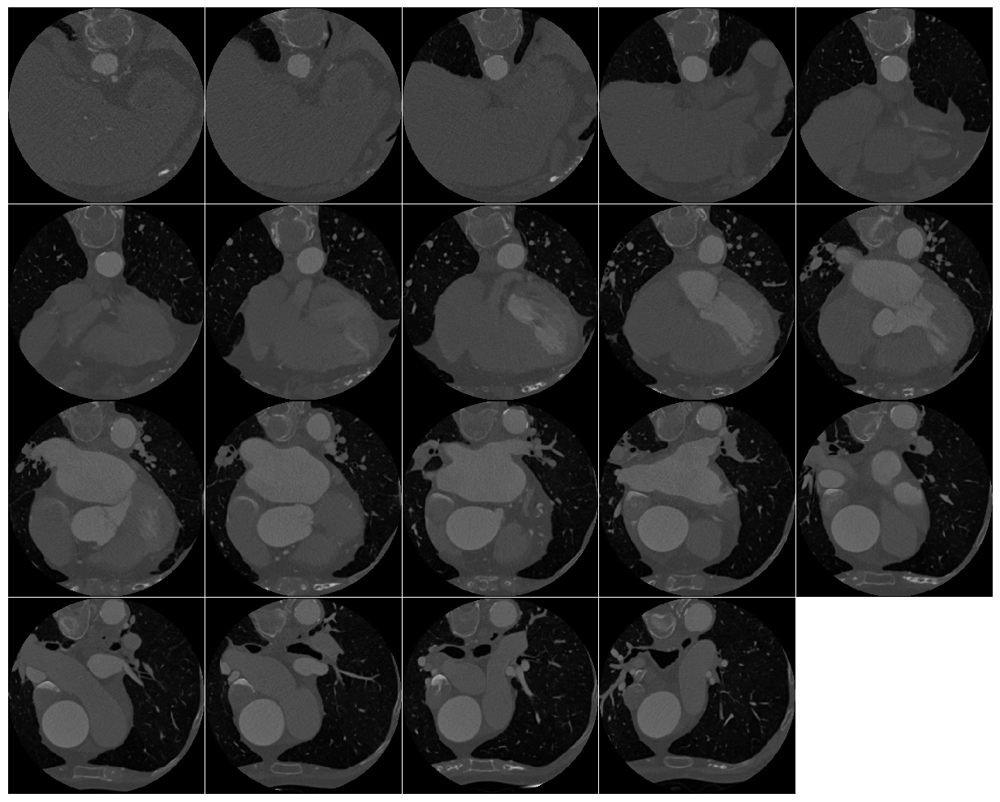

In [ ]:
matshow3d(mmhws_img.swapaxes(2, 0), every_n=20, figsize=(15, 10), cmap="gray");
plt.show()

RPS


`data_array` is not of type `MetaTensor, assuming affine to be identity.


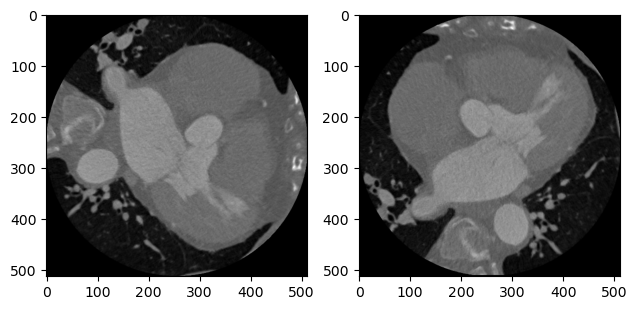

In [ ]:
from monai.transforms import Orientation

_, axes = plt.subplots(1, 2)

orient = "RPS"
print(orient)
mmwhs_monai_orient = Orientation(orient)(mmhws_img[None, ...]).squeeze()

axes[0].imshow(mmhws_img[..., mmhws_img.shape[-1] // 2], cmap="gray")
axes[1].imshow(mmwhs_monai_orient[..., mmwhs_monai_orient.shape[-1] // 2].T, cmap="gray")
plt.tight_layout()

In [ ]:
import numpy as np

rng = np.random.default_rng()
rng

Generator(PCG64) at 0x7F5EC63B98C0

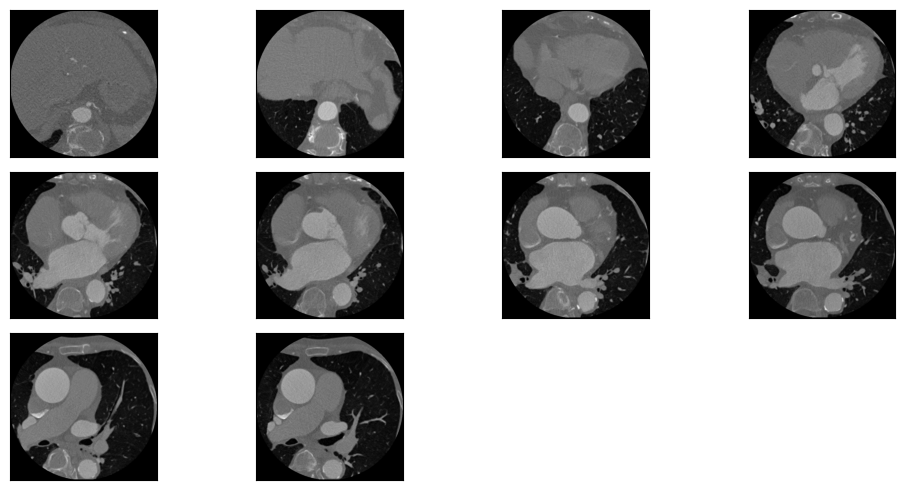

In [ ]:
random_ids = sorted(rng.choice(mmhws_img.shape[-1], 10))
visualization.plot_axial_slices(mmwhs_monai_orient[..., random_ids], figsize=(10, 5));

---

### Plot extracted ostia on axial slices

In [ ]:
from pathlib import Path
from typing import Optional, List

import pandas as pd


def get_ostia_rows(df: pd.DataFrame, id_: str, is_cadrads: bool = False) -> np.ndarray:
    indexer, key = list("xyz"), "id"
    if is_cadrads:
        indexer, key = [f"ostium_{c}" for c in indexer], key.upper()
    return df[df[key] == id_][indexer].values


def plot_ostia(
    ostia_df: pd.DataFrame,
    png_dir: Path,
    ccta_h5_paths: Optional[List[Path]] = None,
    dataset_dir: Optional[Path] = None,
):
    png_dir.mkdir(parents=True, exist_ok=True)

    if ccta_h5_paths is None:
        assert dataset_dir is not None
        ccta_h5_paths = dataset_dir.glob("*.h5")

    for ccta_h5_path in sorted(ccta_h5_paths):
        is_cadrads = "CADRADS" in ccta_h5_path

        img, meta, f = io_utils.load_h5_image(ccta_h5_path, is_cadrads=is_cadrads)
        file_id = io_utils.stem(ccta_h5_path)

        ostia_world = get_ostia_rows(ostia_df, file_id, is_cadrads=is_cadrads)
        ostia_image = geometry.world_to_image_coords(
            ostia_world, meta["offset"], meta["spacing"]
        )

        axes = visualization.plot_axial_centerlines(
            img, ostia_image, title=f"{file_id} ostia", figsize=(10, 5)
        )

        fig = axes[0, 0].get_figure()
        outname = png_dir / f"{file_id}_ostia.png"
        plt.savefig(outname)
        print(outname)
        plt.close(fig)
        f.close()


OSTIA_DF = pd.read_excel("/home/marco/data/ostia_world_coords.xlsx")
# OSTIA_DF = pd.read_excel("/home/marco/data/IDR_CADRADS/ostia.xlsx")

DATASET_DIR = Path("/home/marco/data/ASOCA_Philips/images")
# DATASET_DIR = Path("/home/marco/data/IDR_CADRADS/image/image3085/")
# DATASET_DIR = Path("/home/marco/data/MMWHS/ct_train")

# PNG_DIR = Path("/home/marco/contrast-gan-3D/assets")
PNG_DIR = Path("/home/marco/contrast-gan-3D/assets/test")

# plot_ostia(OSTIA_DF, PNG_DIR, dataset_dir=DATASET_DIR)
# plot_ostia(
#     OSTIA_DF,
#     PNG_DIR,
#     ccta_h5_paths=[
#         "/home/marco/data/ASOCA_Philips/images/ASOCA-025.h5",
#         "/home/marco/data/ASOCA_Philips/images/ASOCA-053.h5",
#     ],
# )

---

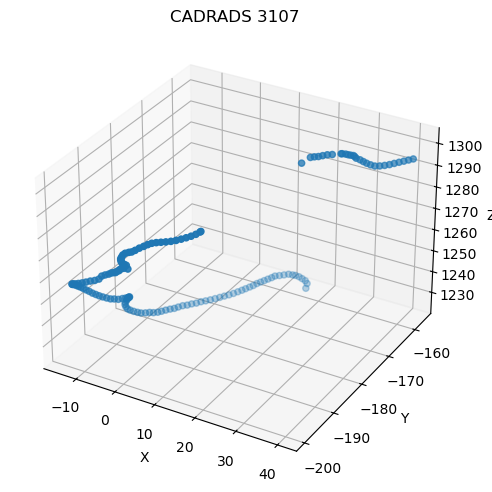

In [ ]:
from matplotlib import pyplot as plt

from contrast_gan_3D.utils import io_utils, visualization

img_3107, meta_3107, f = io_utils.load_h5_image(
    "/home/marco/data/IDR_CADRADS/image/image3107/3107.h5", is_cadrads=True
)
centerlines_3107 = meta_3107["centerlines"][..., :3]
ax = visualization.plot_centerlines_3D(centerlines_3107, "CADRADS 3107", figsize=(5, 5))
plt.tight_layout()
plt.show()
plt.close(ax.get_figure())
f.close()

/home/marco/data/dataset_samples
/home/marco/contrast-gan-3D/assets/ostia
---
/home/marco/data/dataset_samples/3107.mhd /home/marco/data/dataset_samples_centerlines/3107


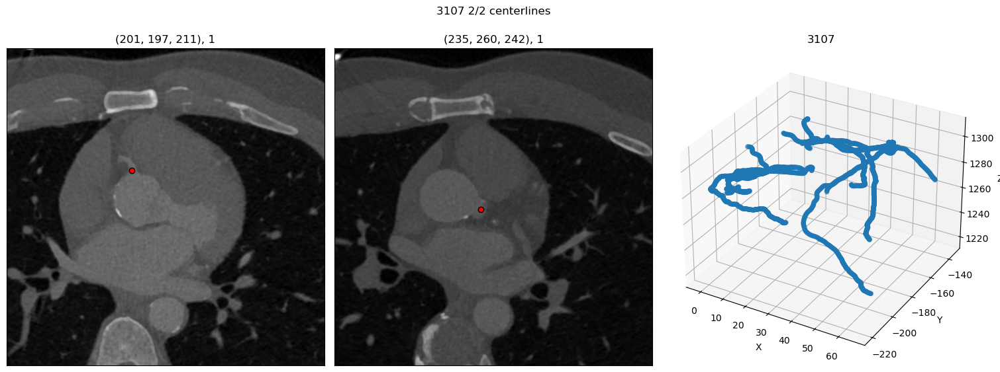

/home/marco/data/dataset_samples/ASOCA-003.mhd /home/marco/data/dataset_samples_centerlines/ASOCA-003


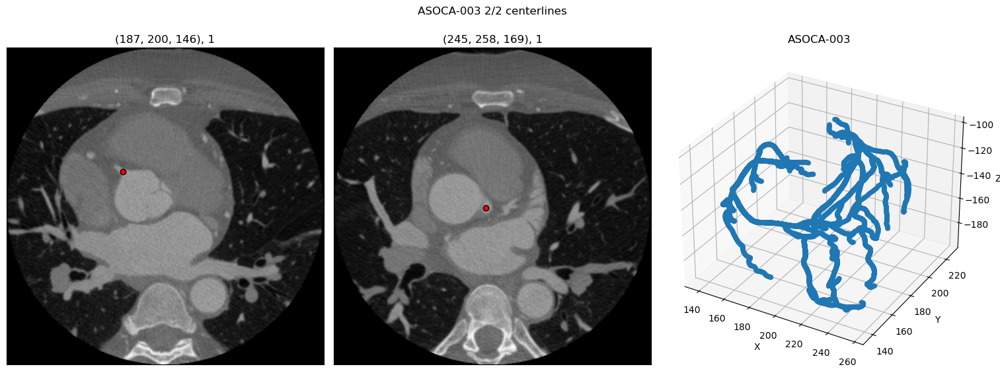

/home/marco/data/dataset_samples/ct_test_2002_image.nii.gz /home/marco/data/dataset_samples_centerlines/ct_test_2002_image.nii.gz


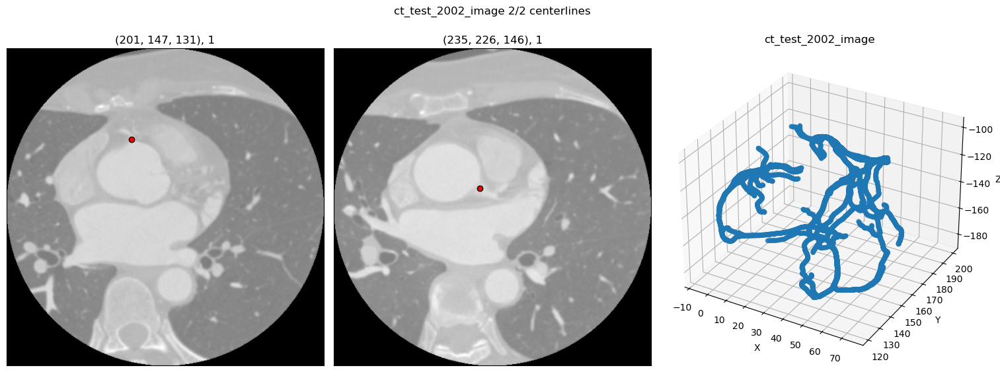

/home/marco/data/dataset_samples/ct_test_2040_image.nii.gz /home/marco/data/dataset_samples_centerlines/ct_test_2040_image.nii.gz


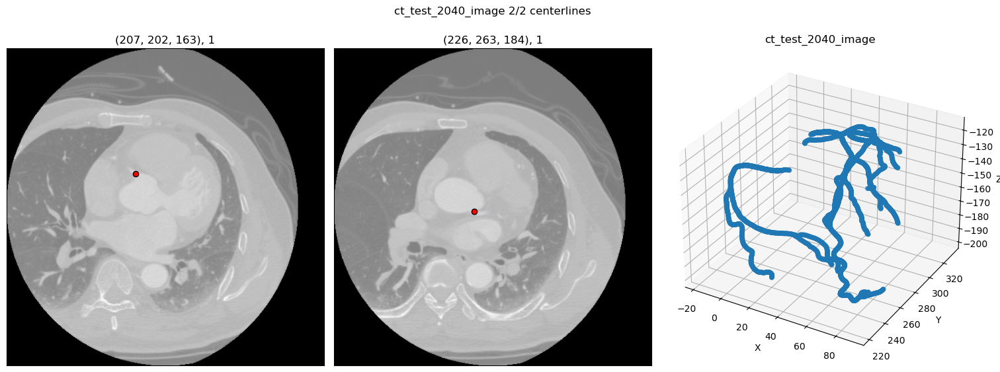

/home/marco/data/dataset_samples/ct_train_1001_image.nii.gz /home/marco/data/dataset_samples_centerlines/ct_train_1001_image.nii.gz


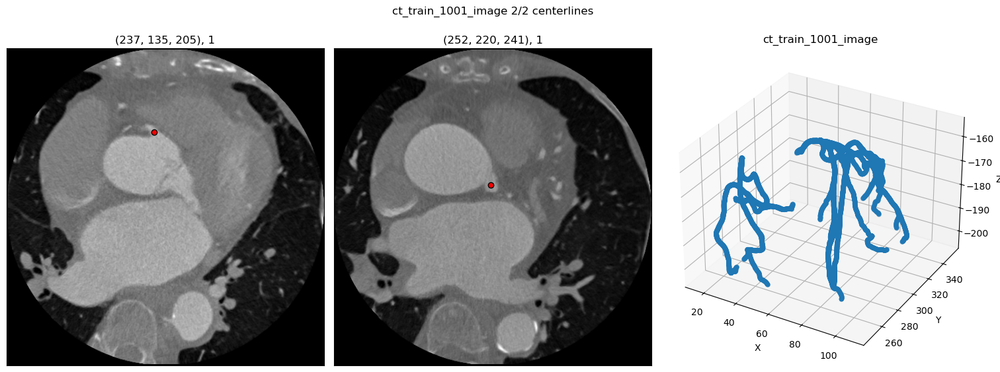

/home/marco/data/dataset_samples/ct_train_1005_image.nii.gz /home/marco/data/dataset_samples_centerlines/ct_train_1005_image.nii.gz


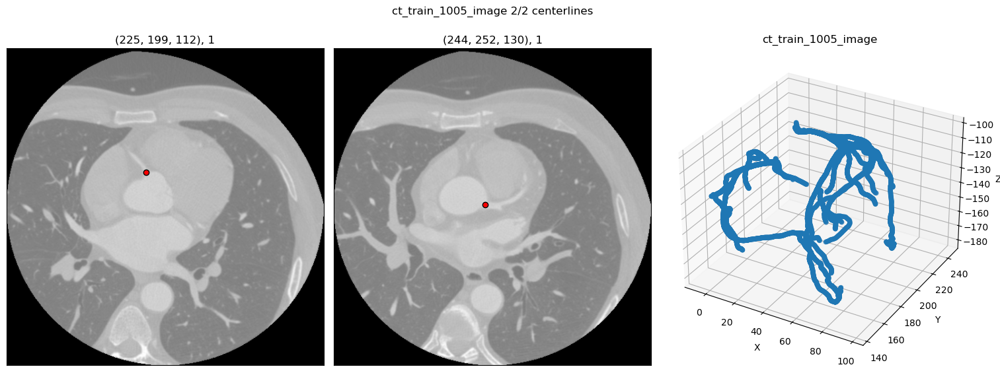

In [ ]:
from pathlib import Path

from monai.transforms import Orientation
import numpy as np

from contrast_gan_3D.utils import geometry

SAMPLES_DIR = Path("/home/marco/data/dataset_samples")
# SAVEDIR = Path("/home/marco/contrast-gan-3D/assets/ostia")
SAVEDIR = None

print(SAMPLES_DIR)
print(SAVEDIR)
print("---")

if SAVEDIR is not None:
    SAVEDIR.mkdir(parents=True, exist_ok=True)

for file_ in sorted(SAMPLES_DIR.glob("*")):
    if file_.suffix == ".zraw":
        continue
    fname, name= io_utils.basename(file_), io_utils.stem(file_)
    ctls_dir = Path(str(SAMPLES_DIR) + "_centerlines") / (fname if ".nii.gz" in fname else name)

    print(file_, ctls_dir)

    im, meta = io_utils.load_sitk_image(file_)
    if ".nii.gz" in str(ctls_dir):
        im = Orientation("RPS")(im[None, ...]).squeeze()
    centerlines = io_utils.load_centerlines(ctls_dir, create=False)
    ostia, _ = io_utils.load_mevis_coords(ctls_dir / "ostia.xml")
    ostia_im_coords = geometry.world_to_image_coords(
        ostia, meta["offset"], meta["spacing"]
    )

    fig = plt.figure(figsize=(15, 6))
    for i in range(1, 3):
        fig.add_subplot(1, 3, i)
    fig.add_subplot(1, 3, 3, projection="3d")
    axes = np.array(fig.axes)

    visualization.plot_axial_centerlines(
        im, ostia_im_coords, title=name, axes=axes.flat[:-1]
    )
    visualization.plot_centerlines_3D(
        centerlines[..., :3], title=name, ax=axes.flat[-1]
    )

    if SAVEDIR is not None:
        plt.savefig(SAVEDIR / f"{name}_ostia_sample.png")
    plt.show()
    plt.close(fig)

Convert: uint16 -> np.int16
Convert: torch.float32 -> np.int16
Convert: torch.float32 -> np.int16
Convert: torch.float32 -> np.int16
Convert: torch.float32 -> np.int16


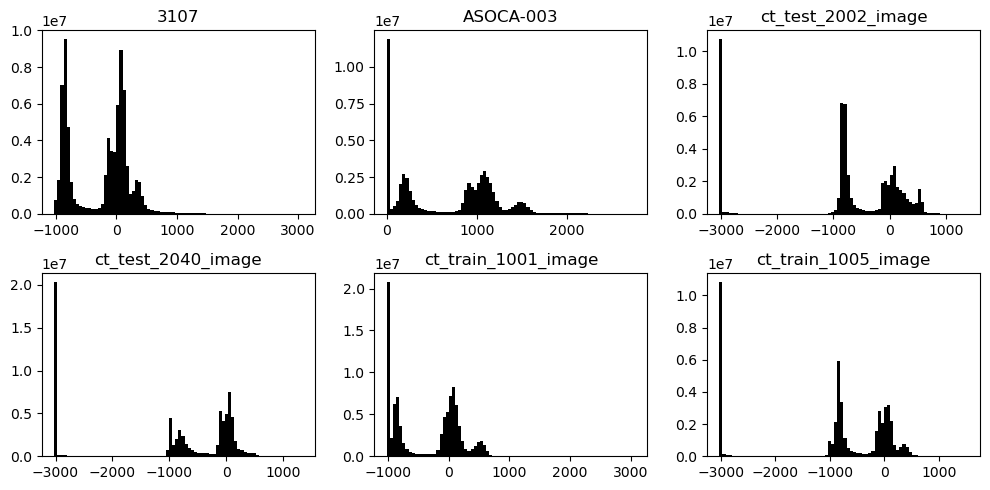

In [ ]:
from monai.transforms import Orientation

img_paths = sorted([
    p for p in SAMPLES_DIR.glob("*") if not str(p).endswith(".zraw")
])
store = []
for p in img_paths:
    img, _ = io_utils.load_sitk_image(p)
    if str(p).endswith(".nii.gz"):
        img = Orientation("RPS")(img[None, ...]).squeeze()
    if img.dtype != np.int16:
        print(f"Convert: {img.dtype} -> np.int16")
        img = img.astype(np.int16)
    store.append((img, io_utils.stem(p)))

visualization.plot_image_histogram(*store, tight=True);

`data_array` is not of type `MetaTensor, assuming affine to be identity.


145
105
181


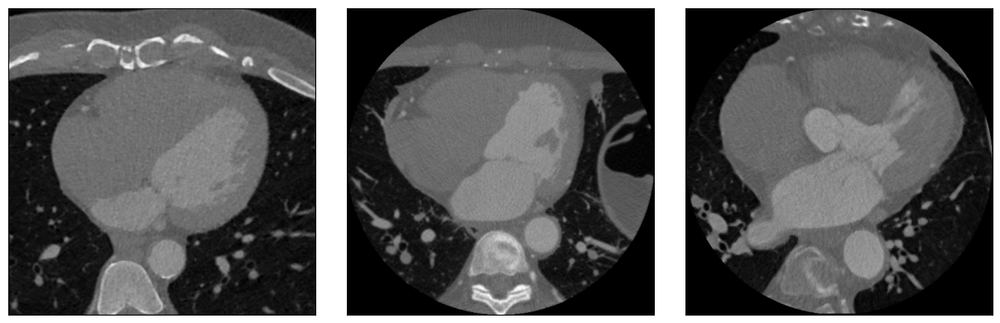

In [ ]:
def middle(img):
    m = img.shape[-1] // 2
    print(m)
    return m

fig, axes = plt.subplots(1, 3, figsize=(13, 4))

cadrads_3107, _ = io_utils.load_sitk_image(
    "/home/marco/data/IDR_CADRADS/image/image3107/3107.mhd"
)
asoca_003, _ = io_utils.load_sitk_image("/home/marco/data/ASOCA_Philips/images/ASOCA-003.mhd")
mmwhs_1001, _ = io_utils.load_sitk_image("/home/marco/data/MMWHS/ct_train/ct_train_1001_image.nii.gz")
mmwhs_1001 = Orientation("RPS")(mmwhs_1001[None, ...]).squeeze()

for i, im in enumerate([cadrads_3107, asoca_003, mmwhs_1001]):
    visualization.plot_axial_slices(
        im[..., middle(im), None], axes=axes[i]
    )

plt.show()
plt.close(fig)

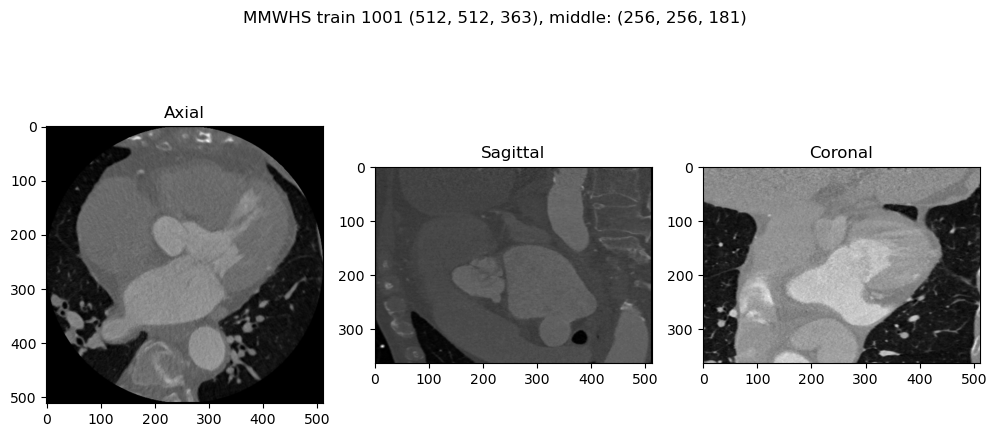

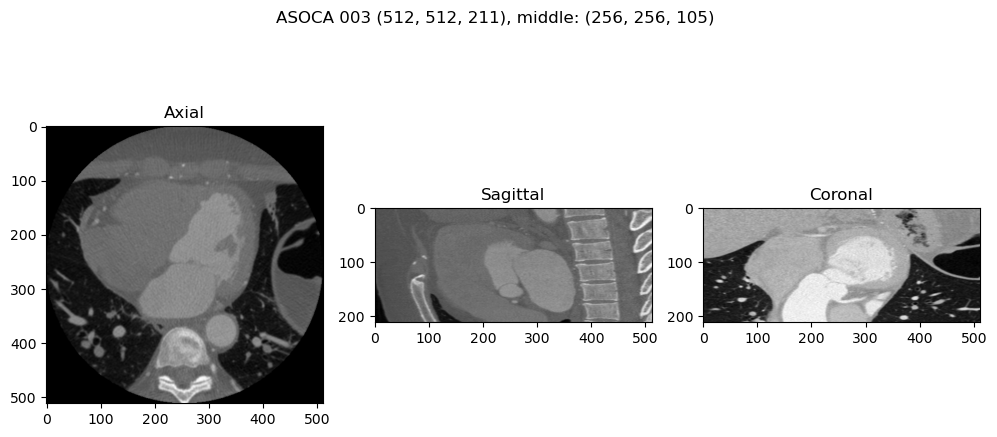

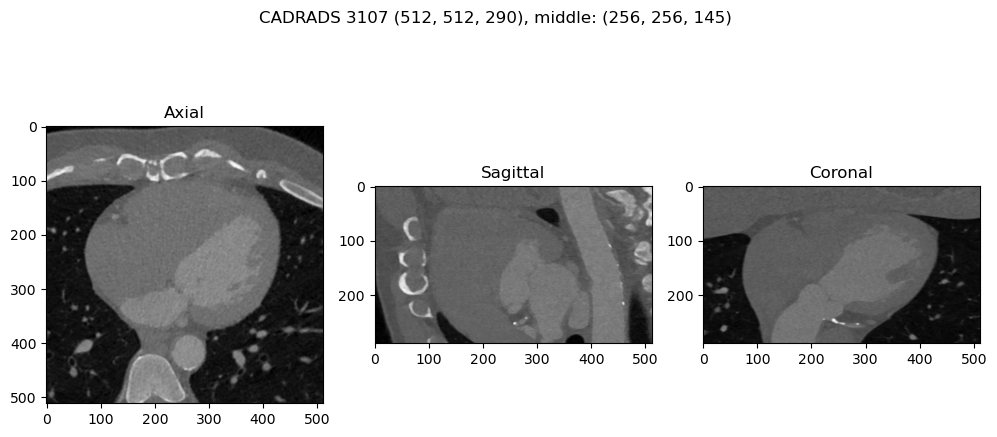

In [ ]:
axes = visualization.plot_mid_slice(mmwhs_1001, title="MMWHS train 1001")
plt.show()
plt.close(axes[0, 0].get_figure())

axes = visualization.plot_mid_slice(asoca_003, title="ASOCA 003")
plt.show()
plt.close(axes[0, 0].get_figure())

axes = visualization.plot_mid_slice(cadrads_3107, title="CADRADS 3107")
plt.show()
plt.close(axes[0, 0].get_figure())